In [1]:
# -*- coding: utf-8 -*-
#  Copyright 2023 United Kingdom Research and Innovation
#
#  Licensed under the Apache License, Version 2.0 (the "License");
#  you may not use this file except in compliance with the License.
#  You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
#  Unless required by applicable law or agreed to in writing, software
#  distributed under the License is distributed on an "AS IS" BASIS,
#  WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
#  See the License for the specific language governing permissions and
#  limitations under the License.
#
#   Authored by:  Francesca Bevilacqua (University of Bologna)
#   Reviewed by:  Margaret Duff (STFC - UKRI )

# Comparison between the Least Square and the Weighted Least Square and the Kullback Leibler Divergence
As we know, the data in computed tomography is affected by Poisson Noise due to the electromagnetic nature of X-rays. The Poisson distribution can be easily approximated by a Gaussian when the mean is high, but it differs from it when the mean is lower. This is the case of Low Dose CT, where the number of photon that reach the detector pixels are less than standard CT.

Here we briefly summarize the acquisition model:
$$I = I_{0} e^{-Ax}$$
where $I$ is the intensity data collected by the detector, $I_{0}$ is the incoming souce intensity, $A$ is the projection operator of Computed Tomography and $x$ is the object (attenuation coefficients) that we want to reconstruct. When adding the Poisson Noise we have:
$$ B \sim \mathrm{Poisson}(I). $$ 

Most of the standard CT reconstruction strategies assume that the mean is high and therefore the Poisson distribution can be approximated by a Gaussian distribution and so 
$$ Y \sim \mathrm{Normal}( Ax,\delta I) $$
where $Y = -\log (\frac{B}{I_{0}})$ is the sinogram data (obtained after taking the negative logarithm of $\frac{B}{I_{0}}$) and   $\delta$ is the noise level. This leads to a least square problem for finding $x$ by solving the following minimisation problem:
$$ \min_{x} \mathcal{F}_{G}(x) := \frac{1}{2} || Y - Ax||_{2}^{2}.$$

Clearly, using this formulation, we are supposing that the distribution of the noise inside $Y$ is a white Gaussian. We know instead that there is instead a Poisson distribution on the measurements, so $B \sim \mathrm{Poisson}( I_{0} e^{-Ax})$.  Taking the negative logorithm of the probability density function of the Poisson noise, we get a Kullback Leibler Divergence loss i.e. if we observe $u \sim\mathrm{Poisson}(v)$ to find $v$ we minimise with respect to $v$ the objective $ KL(u,v) = u \log(\frac{u}{v})-u+v$. Hence, write
$$ \min_{x} \mathcal{F}_{P}(x) := KL(B, I_{0} e^{-Ax}).$$

Between the two approaches, we can consider a quadratic approximation of function $\mathcal{F}_{P}$ and  the problem takes the following form:
$$ \min_{x} \mathcal{F_{W}} : = \frac{1}{2} || Y - Ax ||_{W}^{2} \ = \min_{x} \frac{1}{2} \sum_{i} w_{i} (Y-Ax)^2_{i} $$
where $w_{i} = e^{-Y_{i}} = \frac{B}{I_{0}}$. The main difference between $\mathcal{F}_{G}$ and $\mathcal{F}_{W}$ is the weight matrix $W$. This is the weighted least squares approach. 

In this notebook we will see the difference between the solution obtained by minimizing $\mathcal{F}_{G}$, $\mathcal{F}_{W}$ and $\mathcal{F}_{P}$ for the case of low dose CT, i.e. where the distribution of the noise is very different from a white gaussian, and the level of the noise is high. We consider results with and without Total Variation and demonstrate a parameter search for an optimum regularisation parameter. 

In [2]:
# cil imports
from cil.framework import ImageGeometry, DataContainer
from cil.framework import AcquisitionGeometry
from cil.optimisation.functions import Function


from cil.optimisation.functions import LeastSquares, KullbackLeibler, OperatorCompositionFunction, ZeroFunction, IndicatorBox
from cil.optimisation.functions import TotalVariation
from cil.optimisation.algorithms import GD, PDHG, FISTA

from cil.plugins.astra.operators import ProjectionOperator
from cil.plugins.astra.processors import FBP


from cil.plugins import TomoPhantom
from cil.utilities.quality_measures import psnr
from cil.utilities.display import show_geometry
from cil.utilities.display import show2D


import numpy as np
import matplotlib.pyplot as plt


# set up default colour map for visualisation
cmap = "gray"

# set the backend for FBP and the ProjectionOperator
device = 'gpu'

## CIL version 23.1.0 

In [3]:
import cil
print(cil.__version__)

23.1.0


## The dataset 

In this notebook we will use a classical Shepp-Logan phantom generated with the [TomoPhantom toolbox](https://github.com/dkazanc/TomoPhantom).

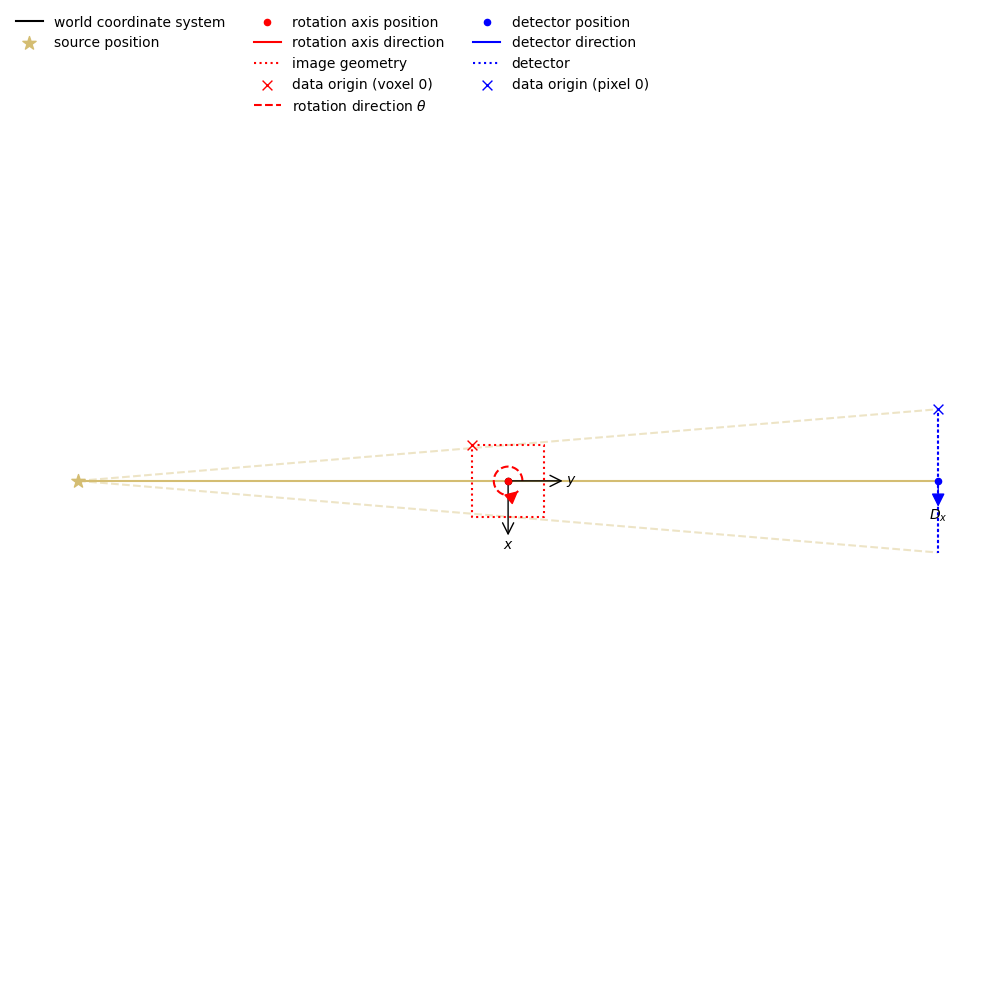

In [4]:
# number of pixels
n_pixels = 256

# Angles
angles = np.linspace(0, 360, 500, endpoint=False, dtype=np.float32)

# set-up fan-beam AcquisitionGeometry
# distance from source to center of rotation
dist_source_center = 6#300.0
# distance from center of rotation to detector
dist_center_detector = 6# 200.0
# physical pixel size
pixel_size_h = 2/n_pixels
#magnification
mag = (dist_source_center + dist_center_detector) / dist_source_center

# Setup acquisition geometry
ag = AcquisitionGeometry.create_Cone2D(source_position=[0,-dist_source_center], detector_position=[0, dist_center_detector])
ag.set_angles(angles=angles)
ag.set_panel(num_pixels=n_pixels, pixel_size=(pixel_size_h, pixel_size_h))

# Setup image geometry
ig = ImageGeometry(voxel_num_x=n_pixels, 
                   voxel_num_y=n_pixels, 
                   voxel_size_x=ag.pixel_size_h / mag, 
                   voxel_size_y=ag.pixel_size_h / mag)
show_geometry(ag)
phantom = TomoPhantom.get_ImageData(num_model=1, geometry=ig)

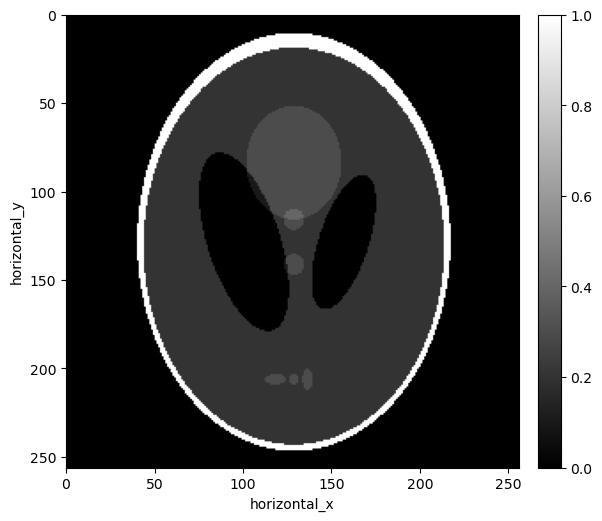

In [5]:
phantom.array[phantom.array<0] = 0
# Visualise data
show2D(phantom, cmap=cmap, num_cols=1, size=(10,10), origin='upper-left')


Next, we create our simulated tomographic data by projecting our noiseless phantom to the acquisition space.

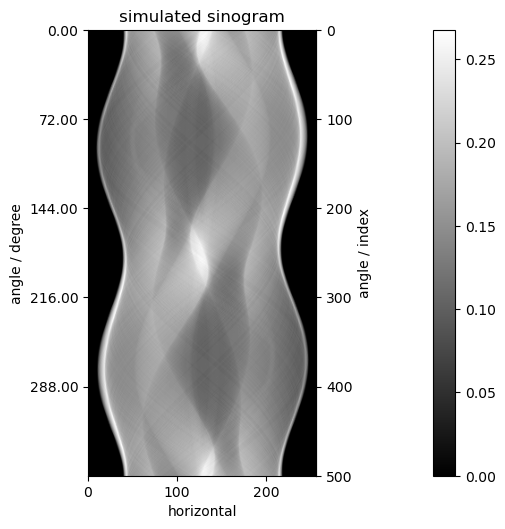

In [6]:
# Create projection operator using Astra-Toolbox.
A = ProjectionOperator(ig, ag, device)

# Create an acqusition data (numerically)
sino = A.direct(phantom)
#print(np.min(sino))

# Visualise data
show2D(sino, 'simulated sinogram', cmap=cmap, size=(10,10), origin='upper-left')

14.496389076227858


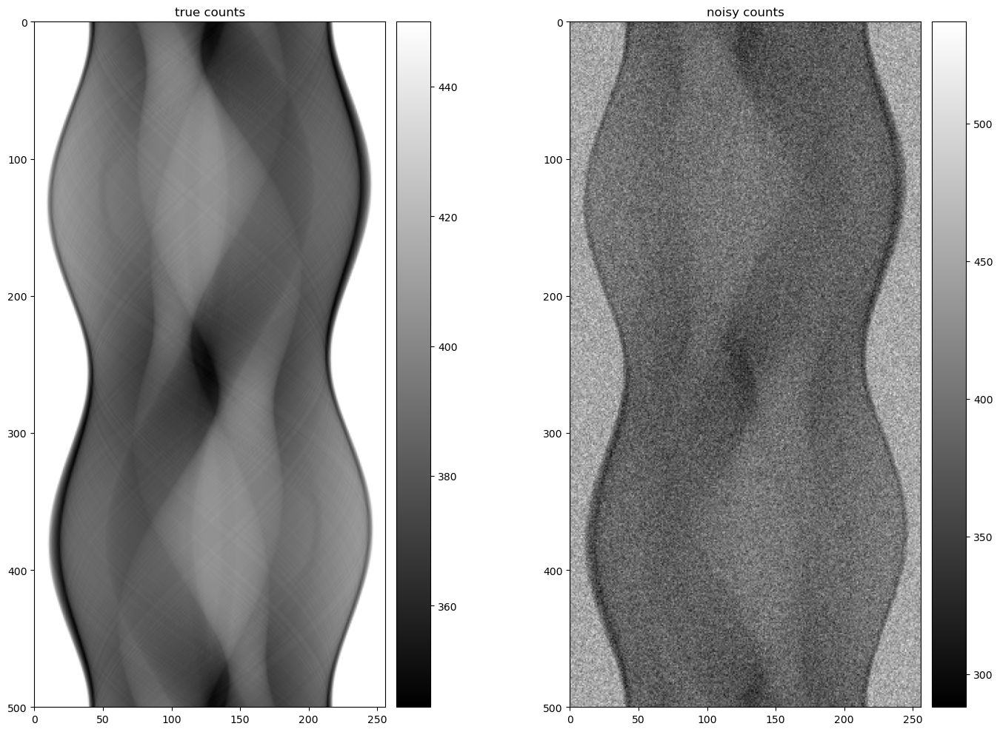

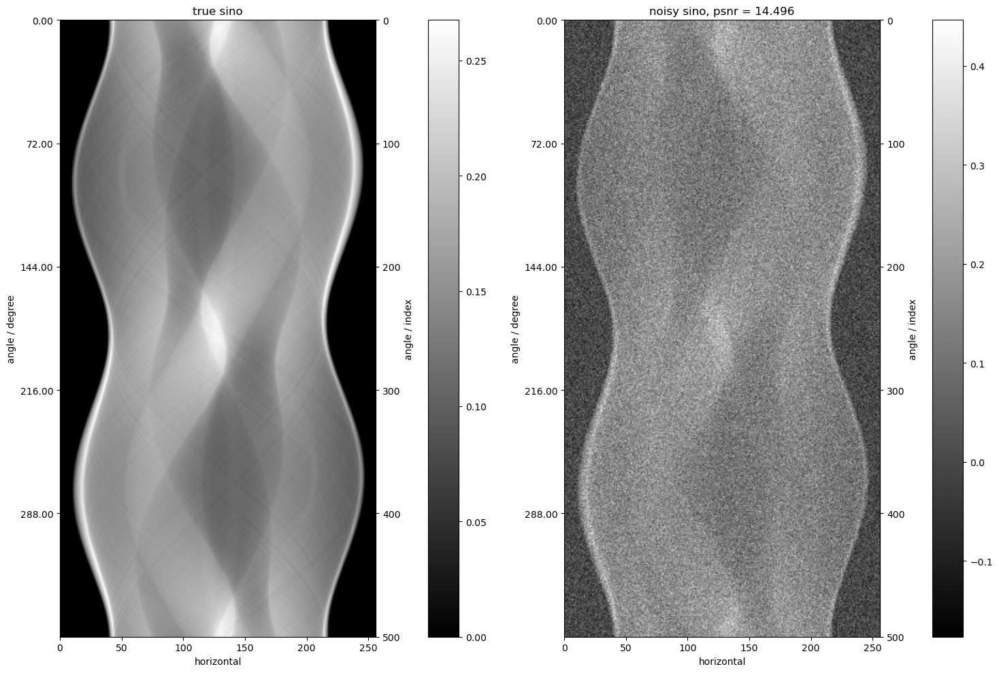

In [7]:
# Incident intensity: lower counts will increase the noise
background_counts = 450

# Convert the simulated absorption sinogram to transmission values using Lambert-Beer. 
# Use as mean for Poisson data generation.
# Convert back to absorption sinogram.
counts = background_counts * np.exp(-sino.as_array())
tmp = np.exp(-sino.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)


# allocate sino_noisy and fill with noisy data
sino_noisy = ag.allocate()
sino_noisy.fill(sino_out)


psnr_sino = psnr(sino, sino_noisy, data_range = np.max(sino))
print(psnr_sino)

# Visualize the true and noisy data
show2D([counts, noisy_counts], ['true counts', 'noisy counts'], \
       cmap=cmap, num_cols=2, size=(15,10), origin='upper-left')
## Visualize the true and noisy data
show2D([sino, sino_noisy], ['true sino', "noisy sino, psnr = %5.3f" % (psnr_sino)], \
       cmap=cmap, num_cols=2, size=(15,10), origin='upper-left')
#plt.savefig("Sinogram_I0_%7.f.png" %(background_counts))

## Reconstruct the noisy data using FBP

In [8]:
# reconstruct full data
# configure FBP
fbp = FBP(ig, ag, device)
# run on the AcquisitionData
recon_fbp = fbp(sino_noisy)
psnr_fbp = psnr(phantom,recon_fbp, np.max(phantom))
#print(psnr_fbp)

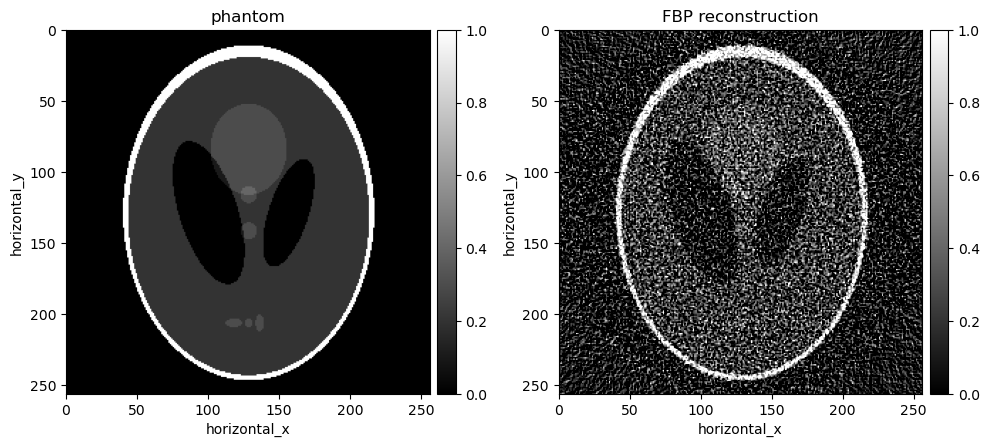

In [9]:
show2D([phantom, recon_fbp], ['phantom', 'FBP reconstruction'], \
       cmap=cmap, fix_range=(0,1),num_cols=2, size=(10,10), origin='upper-left')




## Reconstructing the noisy data using least squares (LS)

So, for the LS problem, we want to minimize the following with respect to $x$:
$$ ||Y-Ax||_{2}^{2}$$


In [10]:

#Definition of the fidelity term
f = LeastSquares(A, sino_noisy)


# Setting up FISTA
myFISTA = FISTA(f=f, 
            g=ZeroFunction(), 
            max_iteration=5000, initial=ig.allocate(0), update_objective_interval=100)
# Run FISTA
myFISTA.run(500, verbose=1)
recon_ls = myFISTA.solution
psnr_ls= psnr(phantom,recon_ls, data_range = np.max(phantom))
           

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       5000         0.000          2.91223e+03


      100       5000         0.030          2.03820e+02
      200       5000         0.031          1.90758e+02
      300       5000         0.031          1.85744e+02
      400       5000         0.030          1.83728e+02
      500       5000         0.029          1.83474e+02
-------------------------------------------------------
      500       5000         0.029          1.83474e+02
Stop criterion has been reached.



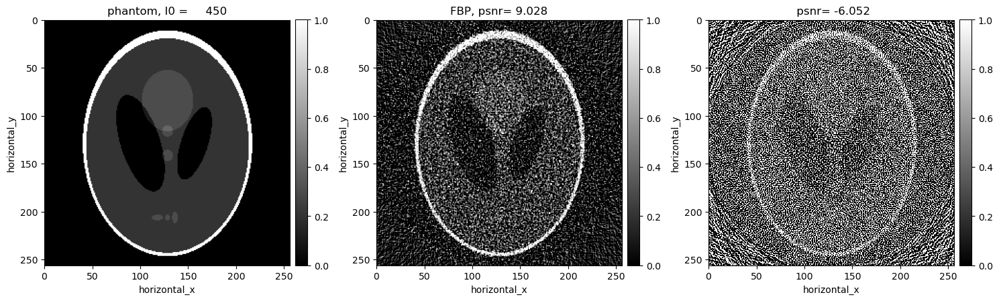

In [11]:
# get and visusualise the results
show2D([phantom, recon_fbp, recon_ls ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    " psnr= %5.3f" % (psnr_ls)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')

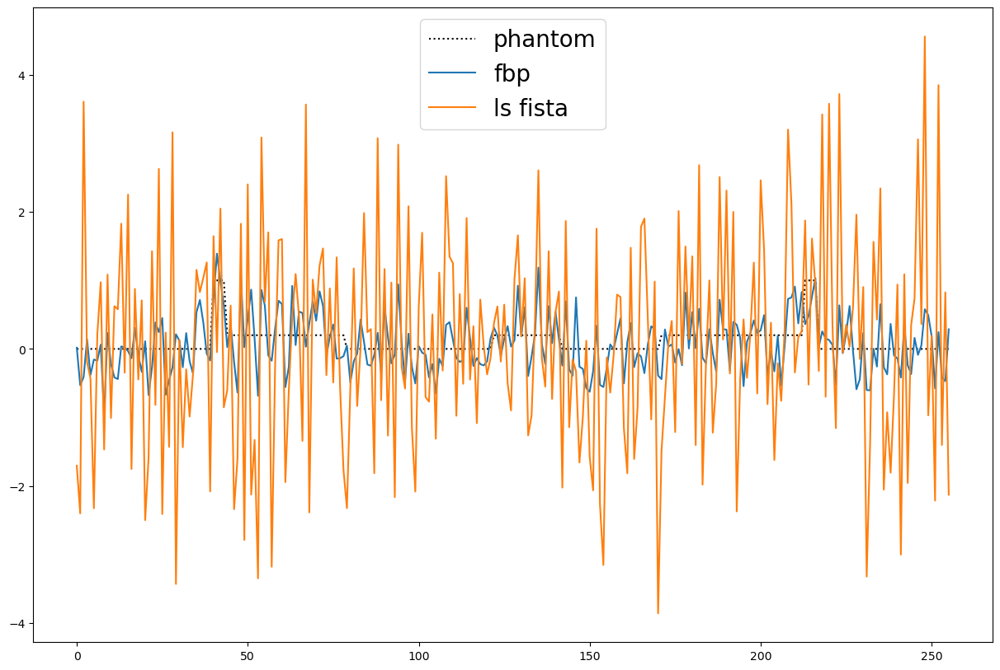

In [12]:
#Visualise the results using a line plot
linenumy=128
plt.figure(figsize=(15,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls.get_slice(horizontal_y=linenumy).as_array(),label="ls fista")
plt.legend(fontsize=20)
plt.show()

## Reconstructing the noisy data using  weighted least squares (WLS)

So, for the LS problem, we want to minimize the following:
$$ ||Y-Ax||_{W}^{2}$$
TODO: where W is....

In [13]:

#Definition of the fidelity term
weights = noisy_counts/background_counts
weights=(1/(np.sqrt(weights)+1))**2
c = ag.allocate(0)
c.fill(weights)
WF = LeastSquares(A, sino_noisy, 1,c)


# Setting up FISTA
myFISTA = FISTA(f=WF, 
            g=ZeroFunction(), 
            max_iteration=500, initial=ig.allocate(0), update_objective_interval=100)
# Run FISTA
myFISTA.run(500, verbose=1)
recon_wls = myFISTA.solution
psnr_wls= psnr(phantom,recon_wls, data_range = np.max(phantom))

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        500         0.000          7.99966e+02


      100        500         0.030          5.47618e+01
      200        500         0.030          5.10938e+01
      300        500         0.030          4.96487e+01
      400        500         0.030          4.90039e+01
      500        500         0.030          4.88243e+01
-------------------------------------------------------
      500        500         0.030          4.88243e+01
Stop criterion has been reached.



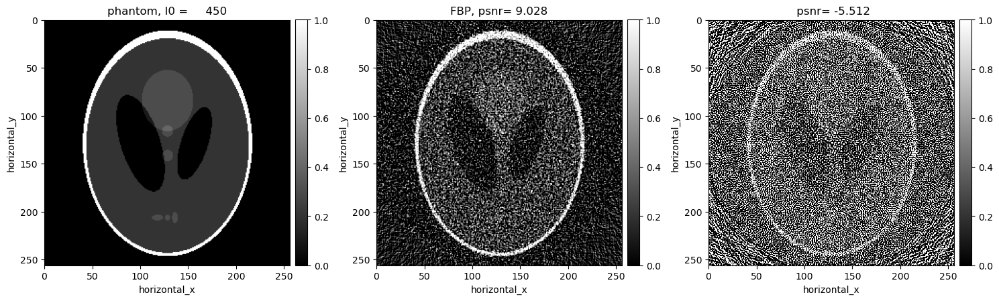

In [14]:
# get and visusualise the results
show2D([phantom, recon_fbp, recon_wls ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    " psnr= %5.3f" % (psnr_wls)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')

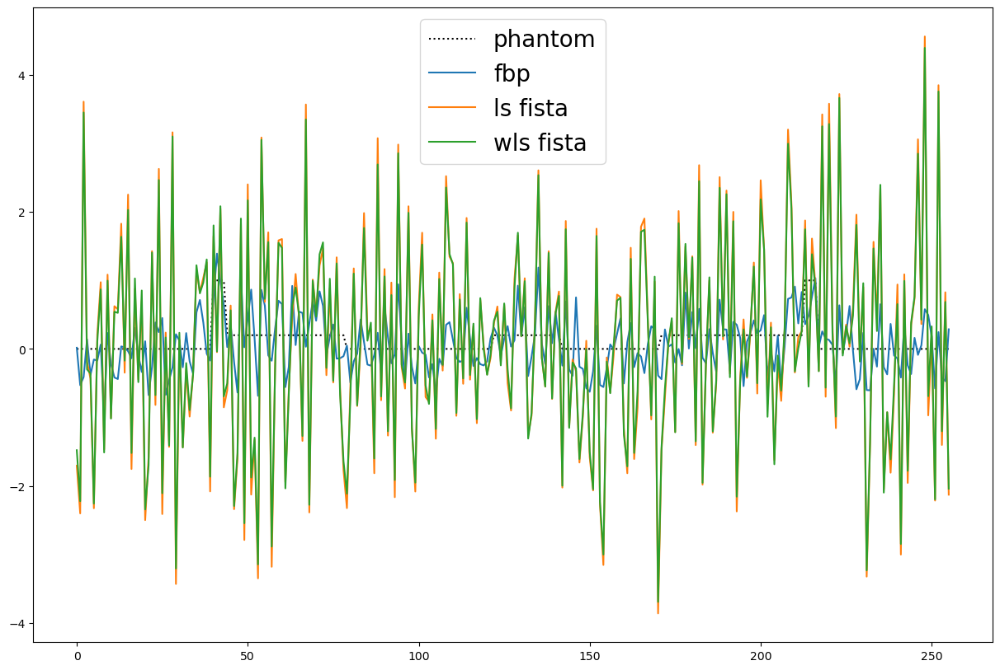

In [15]:
#Visualise the results using a line plot
linenumy=128
plt.figure(figsize=(15,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls.get_slice(horizontal_y=linenumy).as_array(),label="ls fista")
plt.plot(recon_wls.get_slice(horizontal_y=linenumy).as_array(),label="wls fista")
plt.legend(fontsize=20)
plt.show()

## Reconstruct the noisy data using Kullback Liebler (KL) divergence
If  $u \sim \mathrm{Poiss}(v)$, the maximum likelihood of $v$ given observation $u$ is found by minimising with respect to $v$ the objective $$ KL(u,v) = u \log\left(\frac{u}{v}\right)-u+v.$$

Considering $$b = \mathrm{Poiss}\left(I_{0} e^{-Ax}\right)$$
we can define:
$$KL(b,I_{0} e^{-Ax}) = \sum_{i} \bigg[b_{i} \log \left(\frac{b_{i}}{I_{0} e^{-(Ax)_{i}}}\right) - b_{i} + I_{0} e^{-(Ax)_{i}}\bigg] = 
\sum_{i} \bigg[ b_{i}\log(b_{i}) - b_{i} \log(I_{0}) - b_{i} \log\left(I_{0} e^{-(Ax)_{i}}\right) - b_{i} + I_{0} e^{-(Ax)_{i}} \bigg]$$
We want to minimize the KL function with respect to $x$, so we consider
$$KL(b,I_{0} e^{-Ax}) = \sum_{i} \bigg[ b_{i} (Ax)_{i} + I_{0} e^{-(Ax)_{i}}\bigg] +\mathrm{constants}= \sum_{i} \bigg[ \frac{b_{i}}{I_{0}}(Ax)_{i} + e^{-(Ax)_{i}}\bigg]+\mathrm{constants}$$


In [16]:
#Defining the KL fidelity term 
class KL_prelog(Function):
    def __init__(self, d):
        super(KL_prelog, self).__init__(L=1)
        self.d  = d   # d = b/I0
        
    #@property
    #def L(self): 
    #    return 0.00001

    def __call__(self, x):
        vec = x.as_array()
        res = self.d*vec+np.exp(-vec)
        return np.sum(res)


    def gradient(self, x, out=None):
        vec  = x.as_array()
        der  = self.d-np.exp(-vec)
        #res2 = np.sum(der)
        if out is not None:
            out.fill (der)
        else:
            return der

In [17]:


#Definition of the fidelity term
d2 = noisy_counts/background_counts
KL_pre = KL_prelog(d = d2)
f_KL = OperatorCompositionFunction(KL_pre, A)


# Setting up FISTA
myFISTA = FISTA(f=f_KL, 
            g=ZeroFunction(), 
            max_iteration=200, initial=ig.allocate(0), update_objective_interval=100)
# Run FISTA
myFISTA.run(200, verbose=1)
recon_kl = myFISTA.solution
psnr_kl= psnr(phantom,recon_kl, data_range = np.max(phantom))

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        200         0.000          1.28000e+05


      100        200         0.030          1.26807e+05
      200        200         0.030          1.26801e+05
-------------------------------------------------------
      200        200         0.030          1.26801e+05
Stop criterion has been reached.



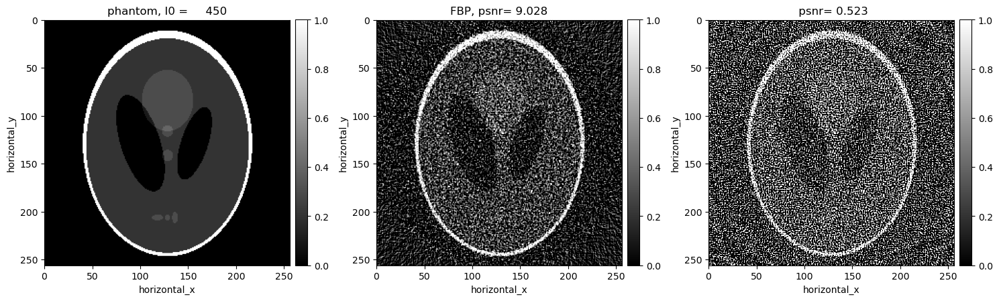

In [18]:
# get and visusualise the results
show2D([phantom, recon_fbp, recon_kl ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    " psnr= %5.3f" % (psnr_kl)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')

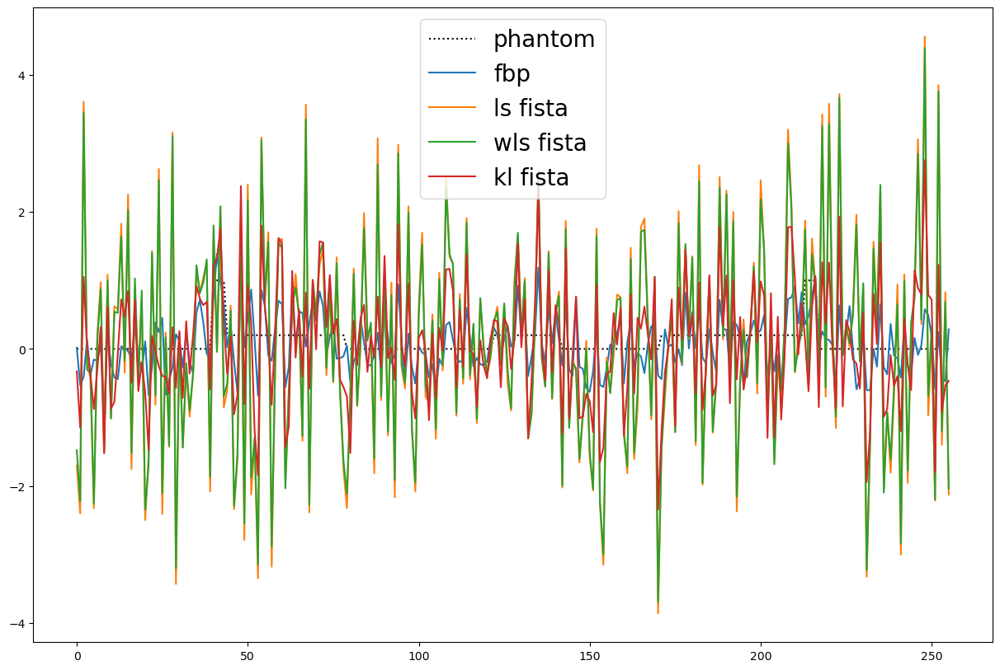

In [19]:
#Visualise the results using a line plot
linenumy=128
plt.figure(figsize=(15,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls.get_slice(horizontal_y=linenumy).as_array(),label="ls fista")
plt.plot(recon_wls.get_slice(horizontal_y=linenumy).as_array(),label="wls fista")
plt.plot(recon_kl.get_slice(horizontal_y=linenumy).as_array(),label="kl fista")
plt.legend(fontsize=20)
plt.show()

## Comparisons without regularisation 


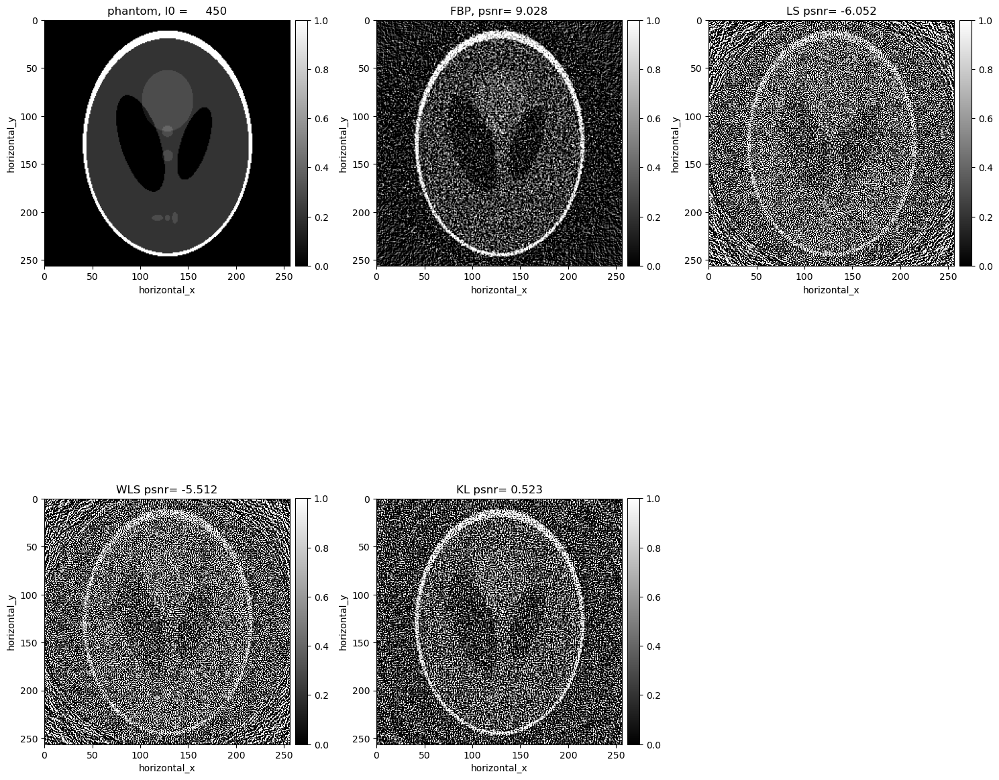

In [41]:

show2D([phantom, recon_fbp, recon_ls,recon_wls, recon_kl ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS psnr= %5.3f" % (psnr_ls),\
    "WLS psnr= %5.3f" % (psnr_wls), \
    "KL psnr= %5.3f" % (psnr_kl)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, origin='upper-left')

The KL reconstruction is better than the WLS reconstruction which is better than the LS reconstruction. However, all the above reconstructions are worse than the FDK reconcstruction and seem to be overfitting to the noise. In the next section, we consider  reconstructions with TV regularisation.

## Reconstructing the noisy data using least squares with Total Variation regualrisation 
In addition to the least-square term, we considered a Total Variation Regulariser.
So, for the LS-TV problem, we want to minimize the following:
$$ ||Y-Ax||_{2}^{2} + \alpha \, TV(x) $$
where $\alpha$ is the regularization parameter that balances the two terms. In the next box, we search over a range of values of $\alpha$ to find the best one for our data. 

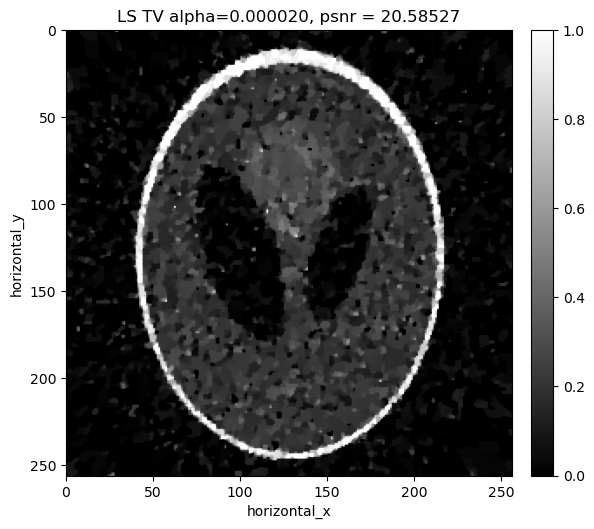

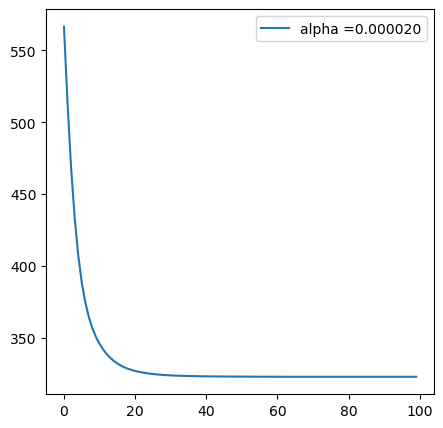

alpha=0.000020, psnr= 20.585
alpha=0.000022, psnr= 21.394
alpha=0.000024, psnr= 22.026
alpha=0.000026, psnr= 22.519
alpha=0.000028, psnr= 22.889


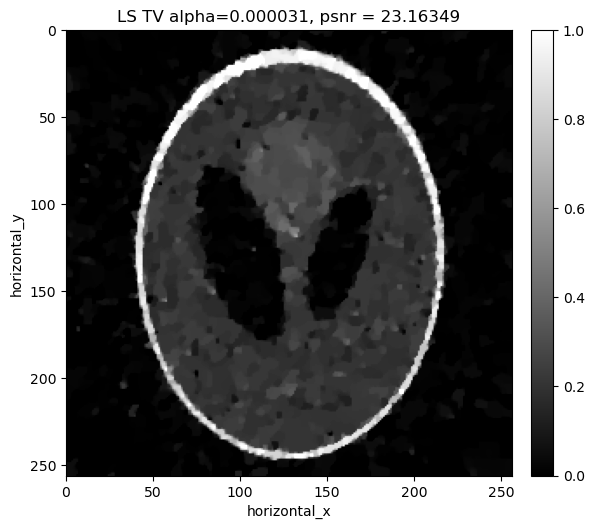

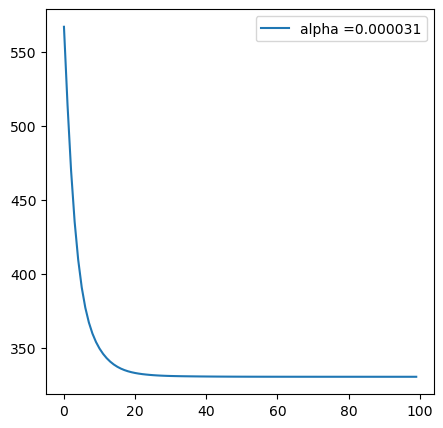

alpha=0.000031, psnr= 23.163
alpha=0.000033, psnr= 23.360
alpha=0.000035, psnr= 23.493
alpha=0.000037, psnr= 23.577
alpha=0.000039, psnr= 23.621


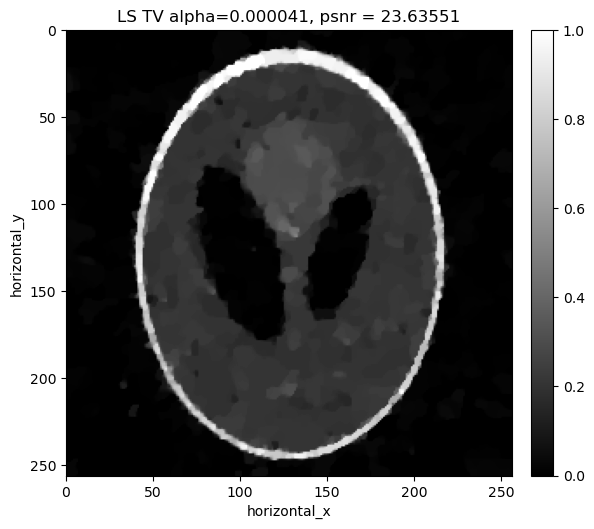

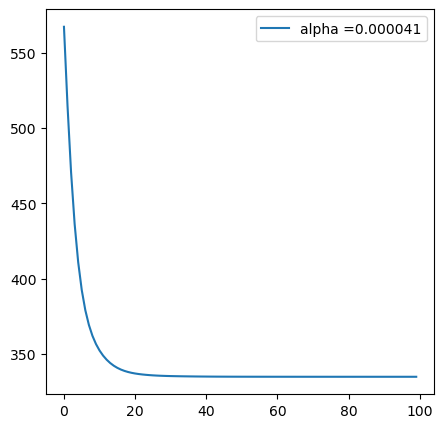

alpha=0.000041, psnr= 23.636
alpha=0.000043, psnr= 23.626
alpha=0.000045, psnr= 23.599
alpha=0.000047, psnr= 23.558
alpha=0.000049, psnr= 23.507


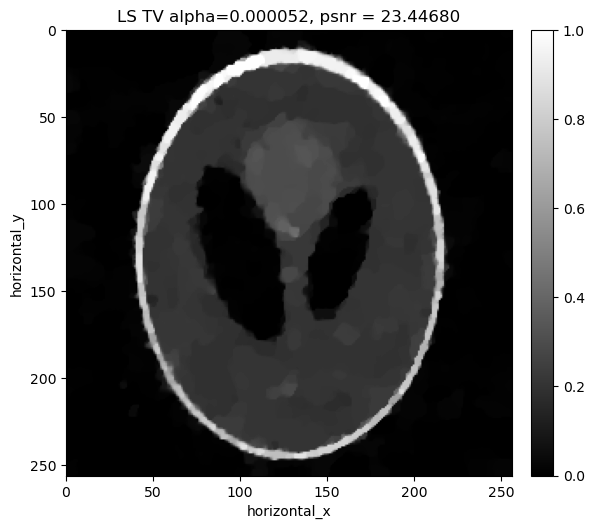

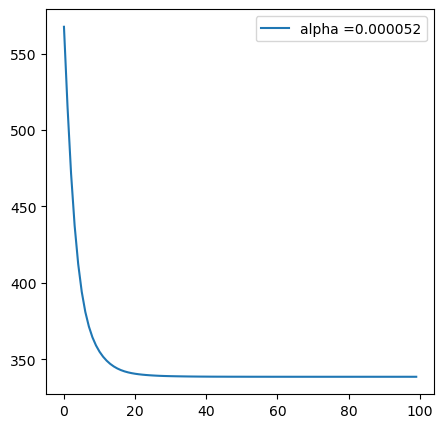

alpha=0.000052, psnr= 23.447
alpha=0.000054, psnr= 23.380
alpha=0.000056, psnr= 23.310
alpha=0.000058, psnr= 23.236
alpha=0.000060, psnr= 23.161


In [21]:
# Selection of the best regularization parametr using LS TV - FISTA
alpha_min = 0.00002
alpha_max = 0.00006
alpha_n   = 20
alphas_ls    = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 5 #how often to plot the reconstructions, for the different values of alpha

#Definition of the fidelity term
f3 = LeastSquares(A, sino_noisy)

#Initialize quantities
psnr_ls_tv_alpha = np.zeros_like(alphas_ls)
max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas_ls[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTATV = FISTA(f=f3, 
                  g=GTV, 
                  max_iteration=100, initial=ig.allocate(0))
    # Run FISTA
    myFISTATV.run(100, verbose=0)
    recon_ls_tv = myFISTATV.solution
    psnr_ls_tv_alpha[i] = psnr(phantom,recon_ls_tv, data_range = np.max(phantom))
    
 
    
    # Save the reconstruction (one every "modulo")
    if i%modulo == 0:
        show2D([recon_ls_tv], ["LS TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_ls_tv_alpha[i])], cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
         # plot the objective function
        plt.figure(figsize=(5,5))
        plt.plot( myFISTATV.objective[1:],label="alpha =%7.6f" % (alpha))
        plt.legend(fontsize=10)
        plt.show()
            
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_ls_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_ls_tv_alpha[i]>max_psnr:
        max_psnr   = psnr_ls_tv_alpha[i]
        best_recon = recon_ls_tv
        best_alpha = alpha
        

In [22]:
#Save the best reconstructions 
recon_ls_tv_fista = best_recon
psnr_ls_tv_fista  = max_psnr
alpha_ls_tv_fista = best_alpha

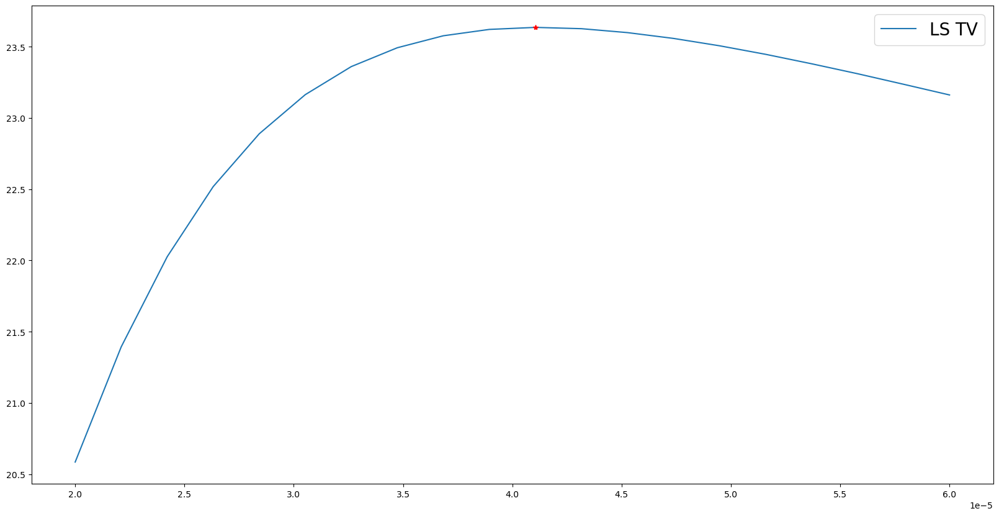

In [23]:
# PSNR for different values of alpha
plt.figure(figsize=(20,10))
plt.plot(alphas_ls,psnr_ls_tv_alpha,label="LS TV")
plt.plot(alpha_ls_tv_fista, psnr_ls_tv_fista, '*r')
plt.legend(fontsize=20)
plt.show()


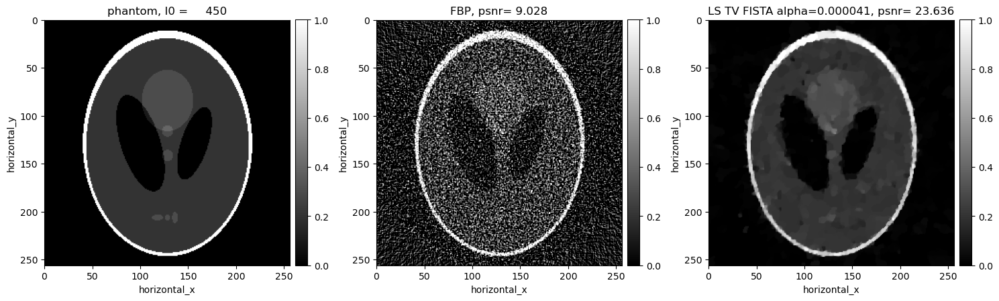

In [24]:
# get and visusualise the results
show2D([phantom, recon_fbp, recon_ls_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')


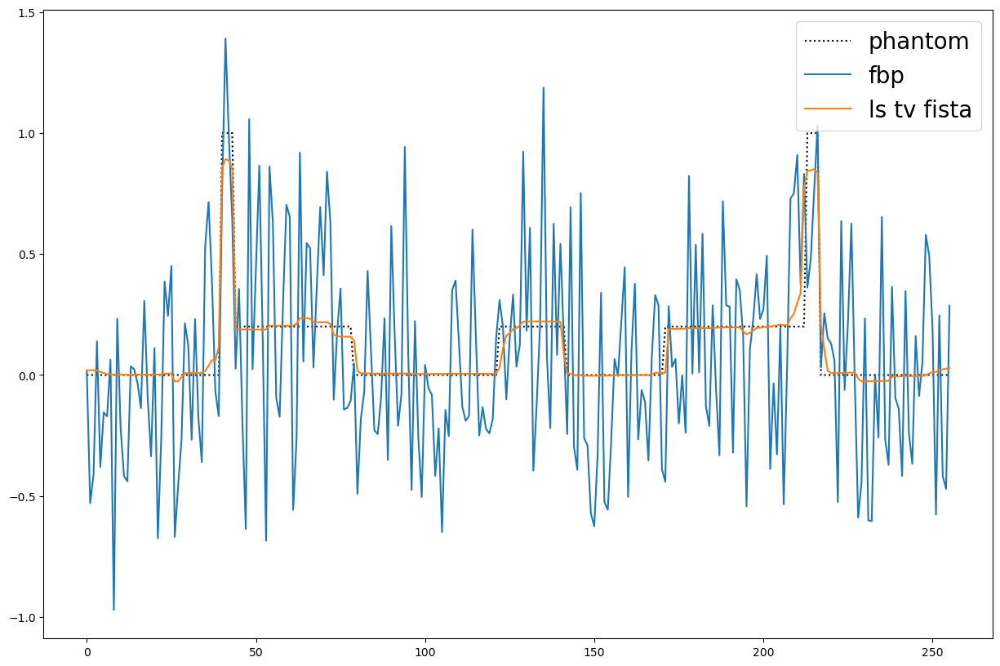

In [25]:
#Visualise the results using a line plot
linenumy=128
plt.figure(figsize=(15,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="fbp")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="ls tv fista")
plt.legend(fontsize=20)
plt.show()

## Reconstructing the noisy data using least squares with Total Variation regualrisation 
Similar to the least squares cas, in addition to the  weighted least square term, we considered a Total Variation Regulariser.
We minimize:
$$ ||Y-Ax||_{W}^{2} + \alpha \, TV(x) $$
where $\alpha$ is the regularization parameter that balances the two terms. Again we search a range of values of $\alpha$ to find the best one for the data. 

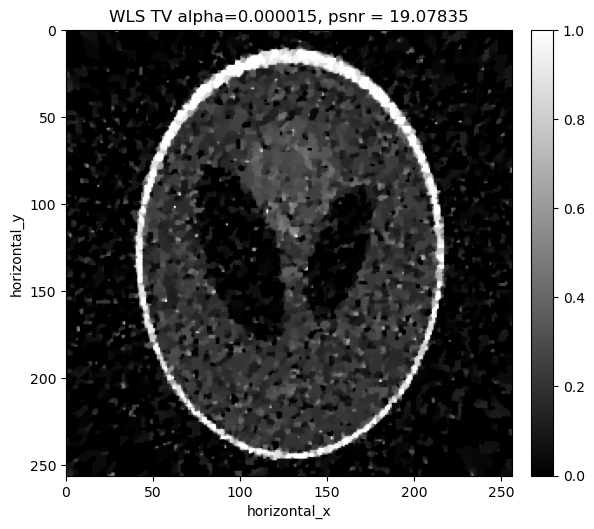

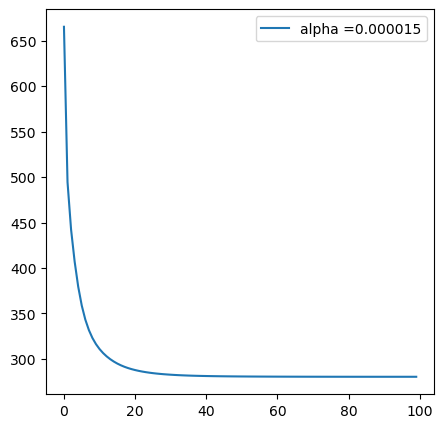

alpha=0.000015, psnr= 19.078
alpha=0.000017, psnr= 20.371
alpha=0.000019, psnr= 21.378
alpha=0.000021, psnr= 22.131
alpha=0.000023, psnr= 22.684


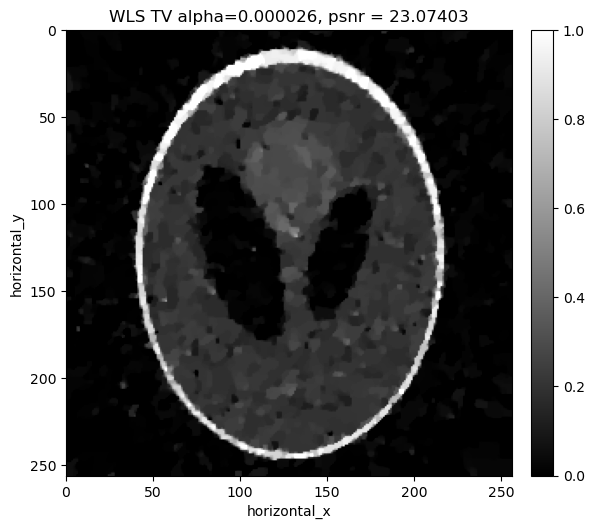

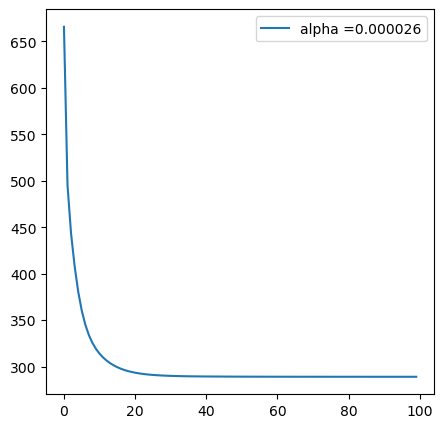

alpha=0.000026, psnr= 23.074
alpha=0.000028, psnr= 23.343
alpha=0.000030, psnr= 23.515
alpha=0.000032, psnr= 23.618
alpha=0.000034, psnr= 23.665


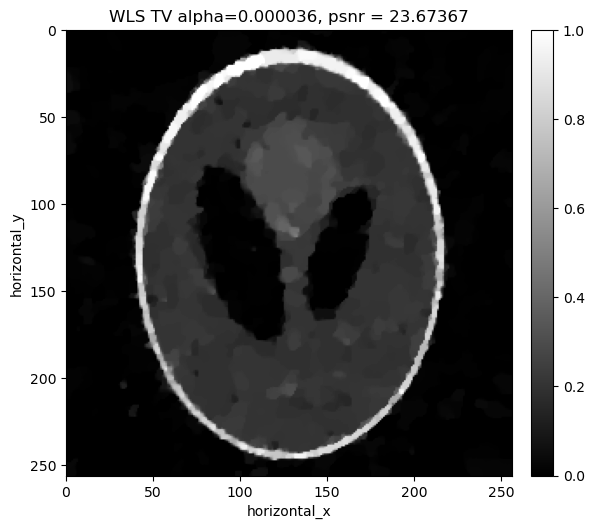

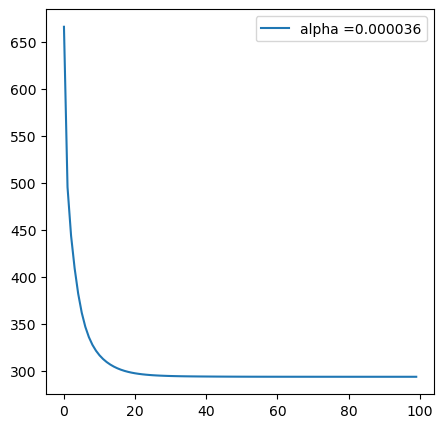

alpha=0.000036, psnr= 23.674
alpha=0.000038, psnr= 23.652
alpha=0.000040, psnr= 23.609
alpha=0.000042, psnr= 23.549
alpha=0.000044, psnr= 23.477


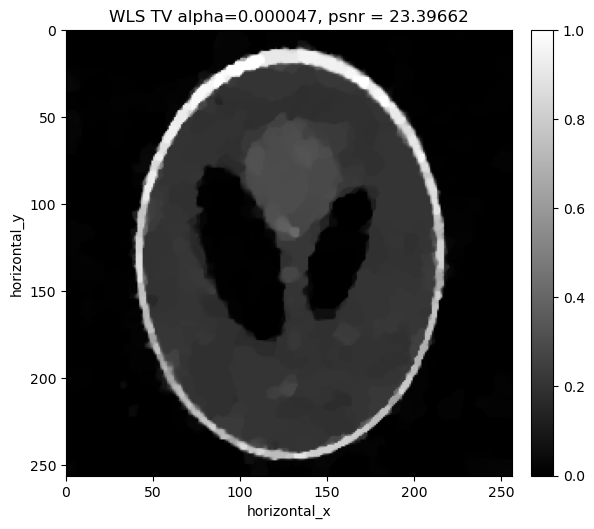

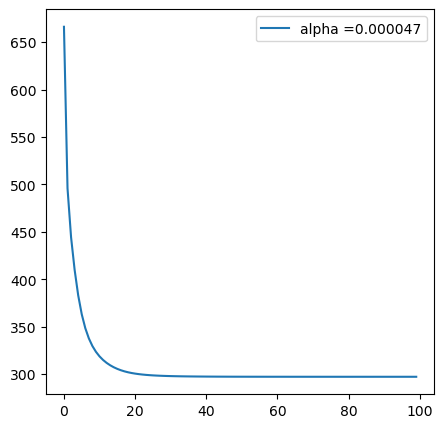

alpha=0.000047, psnr= 23.397
alpha=0.000049, psnr= 23.312
alpha=0.000051, psnr= 23.223
alpha=0.000053, psnr= 23.130
alpha=0.000055, psnr= 23.037


In [26]:
# Selection of the best regularization parameter using WLS TV - FISTA
alpha_min = 0.000015
alpha_max = 0.000055
alpha_n   = 20
alphas_wls   = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 5 #10 #how often to plot reconstructions, for the different values of alpha

#Definition of the fidelity term
weights = noisy_counts/background_counts
c = ag.allocate(0)
c.fill(weights)
WF = LeastSquares(A, sino_noisy, 1,c)

#Initialize quantities
psnr_wls_tv_alpha = np.zeros_like(alphas_wls)
w_max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas_wls[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTAWTV = FISTA(f=WF, 
                  g=GTV, 
                  max_iteration=100, initial=ig.allocate(0))
    # Run FISTA
    myFISTAWTV.run(100, verbose=0)
    recon_wls_tv = myFISTAWTV.solution
    psnr_wls_tv_alpha[i] = psnr(phantom,recon_wls_tv, data_range = np.max(phantom))

    # Plot the reconstruction (one every "modulo")
    if i%modulo == 0:
        
        # plot the reconstruction 
        show2D([recon_wls_tv], ["WLS TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_wls_tv_alpha[i])], \
        cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
        # plot the objective function
        plt.figure(figsize=(5,5))
        plt.plot( myFISTAWTV.objective[1:],label="alpha =%7.6f" % (alpha))
        plt.legend(fontsize=10)
        plt.show()
        
        
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_wls_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_wls_tv_alpha[i]>w_max_psnr:
        w_max_psnr   = psnr_wls_tv_alpha[i]
        w_best_recon = recon_wls_tv
        w_best_alpha = alpha

In [27]:
#save the best reconstruction 
recon_wls_tv_fista = w_best_recon
psnr_wls_tv_fista  = w_max_psnr
alpha_wls_tv_fista = w_best_alpha


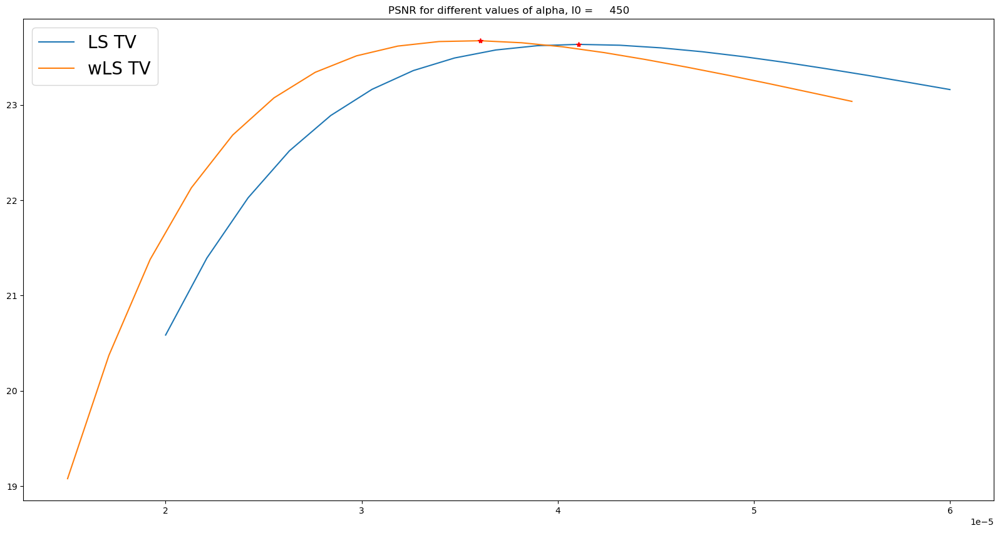

In [28]:
# PSNR for different values of alpha
plt.figure(figsize=(20,10))
plt.plot(alphas_ls,psnr_ls_tv_alpha,label="LS TV")
plt.plot(alphas_wls,psnr_wls_tv_alpha,label="wLS TV")
plt.plot(alpha_ls_tv_fista, psnr_ls_tv_fista, '*r')
plt.plot(alpha_wls_tv_fista, psnr_wls_tv_fista, '*r')
plt.legend(fontsize=20)
plt.title("PSNR for different values of alpha, I0 = %7.f" % (background_counts))
plt.show()


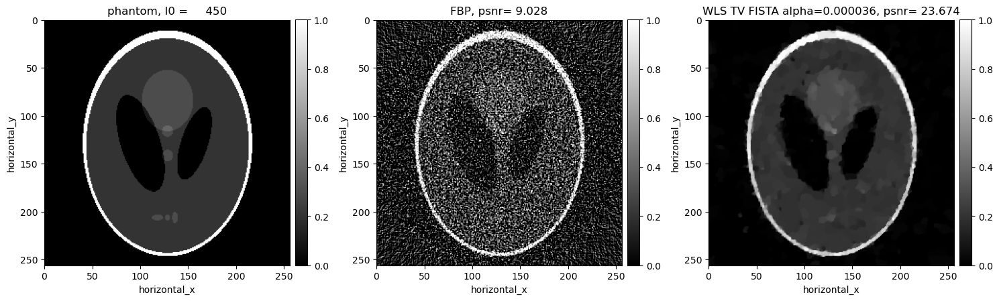

In [29]:
#Visualise the results 
show2D([phantom, recon_fbp, recon_wls_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')


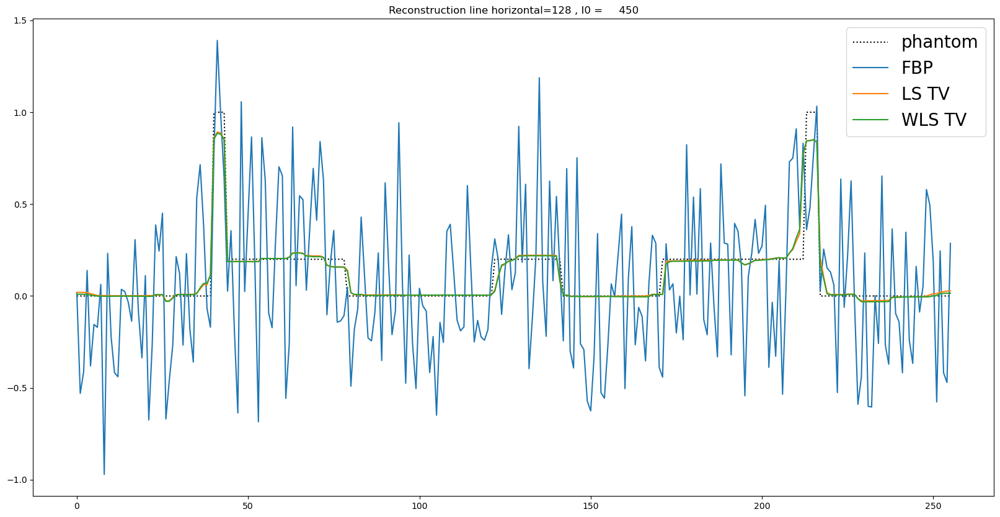

In [30]:
#Use a line plot to compare the reconstructions 
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="WLS TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line horizontal=%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.show()

We can also visualise the weights used:

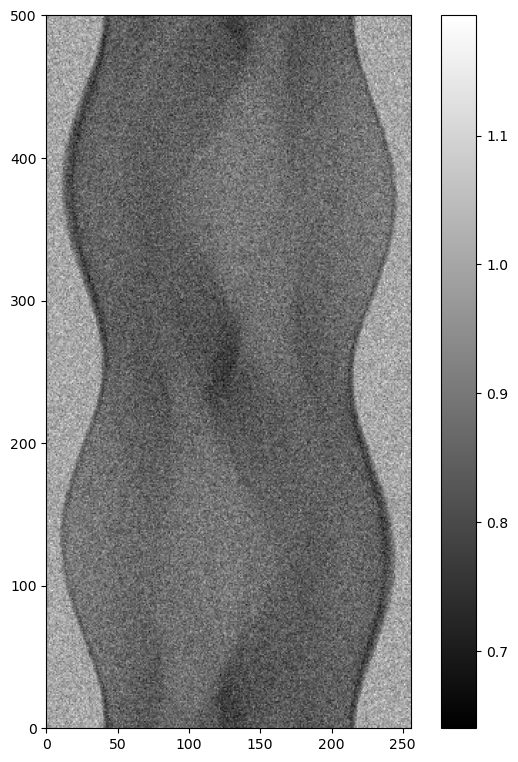

In [31]:
show2D(weights)

# Reconstructing the noisy data using KL divergence with TV regularisation 

As in the least squares and weighted least squares case, we add in a TV regularisation term and search for an optimal regularisation parameter.

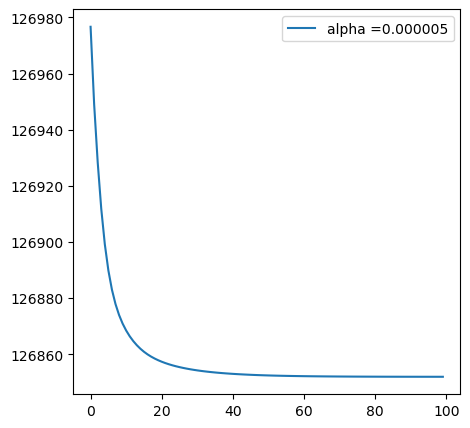

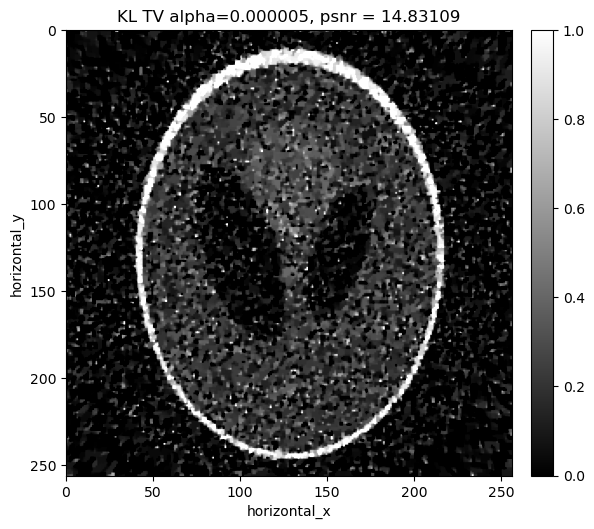

alpha=0.000005, psnr= 14.831
alpha=0.000007, psnr= 18.581
alpha=0.000009, psnr= 21.062
alpha=0.000011, psnr= 22.496
alpha=0.000013, psnr= 23.252


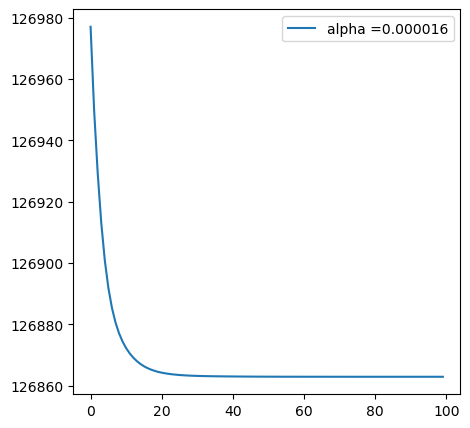

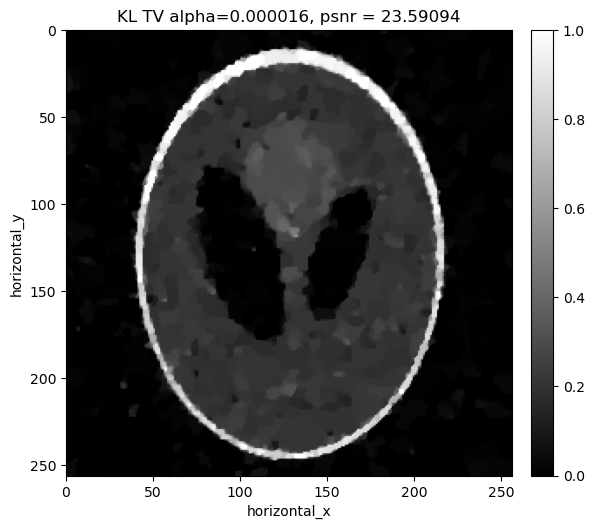

alpha=0.000016, psnr= 23.591
alpha=0.000018, psnr= 23.688
alpha=0.000020, psnr= 23.647
alpha=0.000022, psnr= 23.532
alpha=0.000024, psnr= 23.375


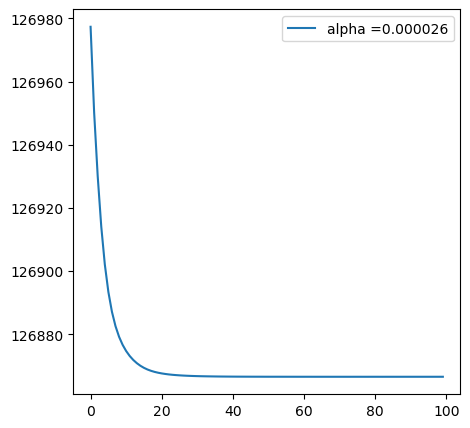

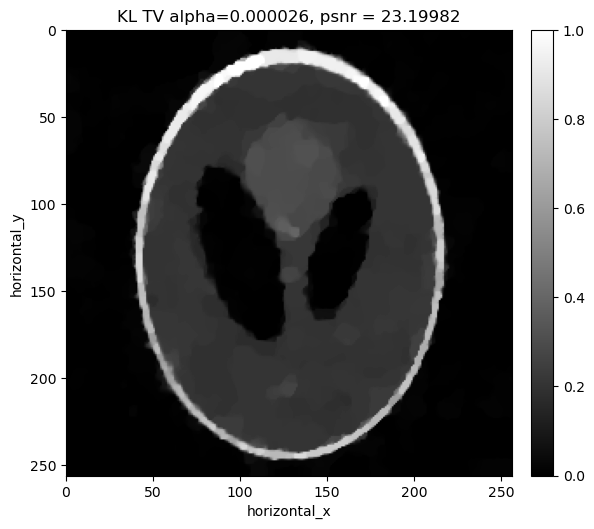

alpha=0.000026, psnr= 23.200
alpha=0.000028, psnr= 23.018
alpha=0.000030, psnr= 22.839
alpha=0.000032, psnr= 22.661
alpha=0.000034, psnr= 22.484


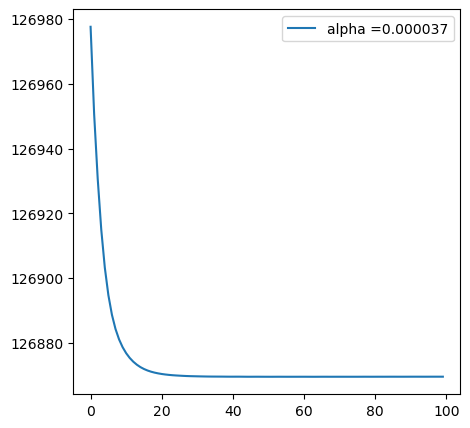

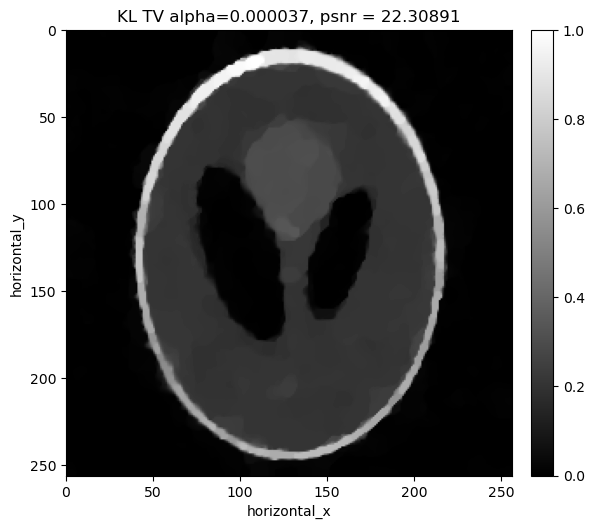

alpha=0.000037, psnr= 22.309
alpha=0.000039, psnr= 22.140
alpha=0.000041, psnr= 21.977
alpha=0.000043, psnr= 21.818
alpha=0.000045, psnr= 21.665


In [32]:
# Selection of the best regularization parametr using KL TV - FISTA
alpha_min = 0.000005
alpha_max = 0.000045
alpha_n   = 20
alphas_kl    = np.linspace(alpha_min, alpha_max, alpha_n) 
modulo    = 5 #10 #how often to save reconstructions, for the different values of alpha

#Definition of the fidelity term
d2 = noisy_counts/background_counts
KL_pre = KL_prelog(d = d2)
f_KL = OperatorCompositionFunction(KL_pre, A)

#Initialize quantities
psnr_kl_tv_alpha = np.zeros_like(alphas_kl)
kl_max_psnr = 0

# Run the loop over the different values of alpha
for i in range(alpha_n):
    alpha = alphas_kl[i]
    # Defining the regularization term with the new alpha
    GTV = alpha*TotalVariation()
    # Setting up FISTA
    myFISTAKLTV = FISTA(f=f_KL, 
                  g=GTV, 
                  max_iteration=100, initial=ig.allocate(0))
    # Run FISTA
    myFISTAKLTV.run(100, verbose=0)
    recon_kl_tv = myFISTAKLTV.solution
    psnr_kl_tv_alpha[i] = psnr(phantom,recon_kl_tv, data_range = np.max(phantom))
    
    
    
    # Plot the reconstruction (one every "modulo")
    if i%modulo == 0:
        # plot the objective function
        plt.figure(figsize=(5,5))
        plt.plot( myFISTAKLTV.objective[1:],label="alpha =%7.6f" % (alpha))
        plt.legend(fontsize=10)
        
        # plot the reconstruction 
        show2D([recon_kl_tv], ["KL TV alpha=%7.6f, psnr = %7.5f" % (alpha,psnr_kl_tv_alpha[i])], \
        cmap=cmap,fix_range=(0,1), size=(10,10), origin='upper-left')
        
        
    # print the value of alpha and the obtained psnr of the reconstruction
    print("alpha=%7.6f, psnr= %5.3f" % (alpha,psnr_kl_tv_alpha[i]))
    
    # Save the best reconstruction
    if psnr_kl_tv_alpha[i]>kl_max_psnr:
        kl_max_psnr   = psnr_kl_tv_alpha[i]
        kl_best_recon = recon_kl_tv
        kl_best_alpha = alpha

In [33]:
#Save the optimal parameters
recon_kl_tv_fista = kl_best_recon
psnr_kl_tv_fista  = kl_max_psnr
alpha_kl_tv_fista = kl_best_alpha


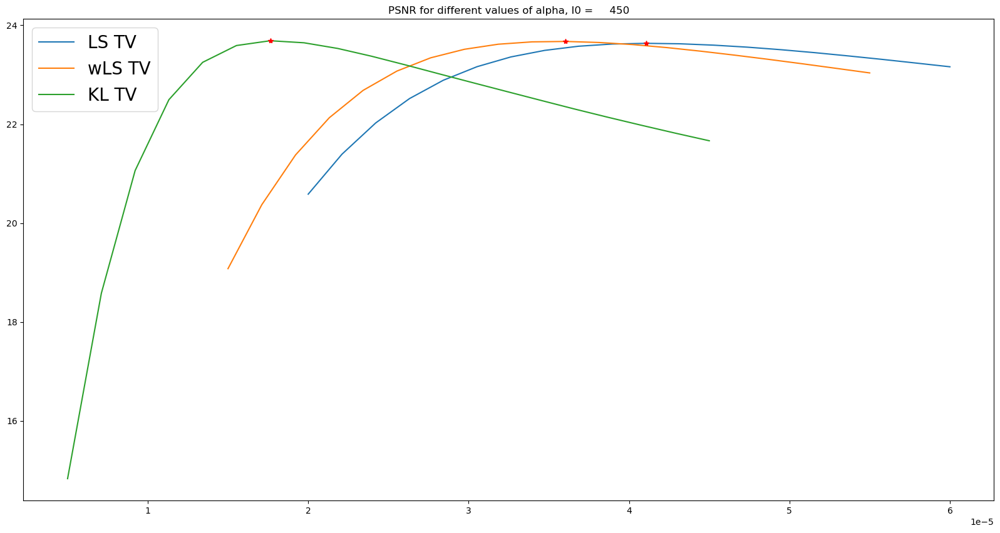

In [34]:
#PSNR for different values of alpha 
plt.figure(figsize=(20,10))
plt.plot(alphas_ls,psnr_ls_tv_alpha,label="LS TV")
plt.plot(alphas_wls,psnr_wls_tv_alpha,label="wLS TV")
plt.plot(alphas_kl,psnr_kl_tv_alpha,label="KL TV")
plt.plot(alpha_ls_tv_fista, psnr_ls_tv_fista, '*r')
plt.plot(alpha_wls_tv_fista, psnr_wls_tv_fista, '*r')
plt.plot(alpha_kl_tv_fista, psnr_kl_tv_fista, '*r')
plt.legend(fontsize=20)
plt.title("PSNR for different values of alpha, I0 = %7.f" % (background_counts))
plt.show()

We see for that different loss terms there is a different optimal regularisation parameter/

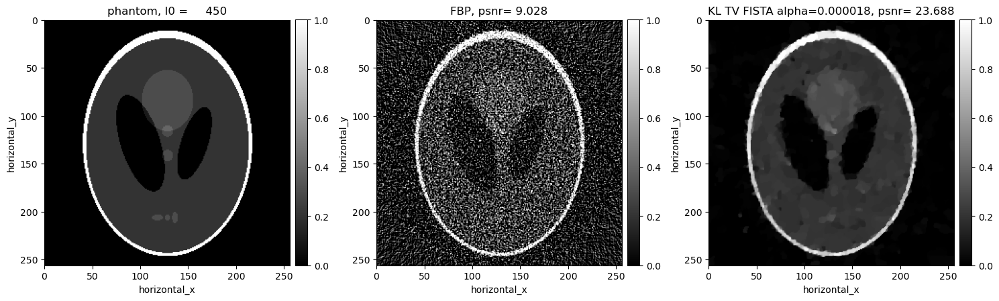

In [35]:
#Visualise the reconstructions 
show2D([phantom, recon_fbp, recon_kl_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "KL TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_kl_tv_fista,psnr_kl_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, size=(15,10), origin='upper-left')


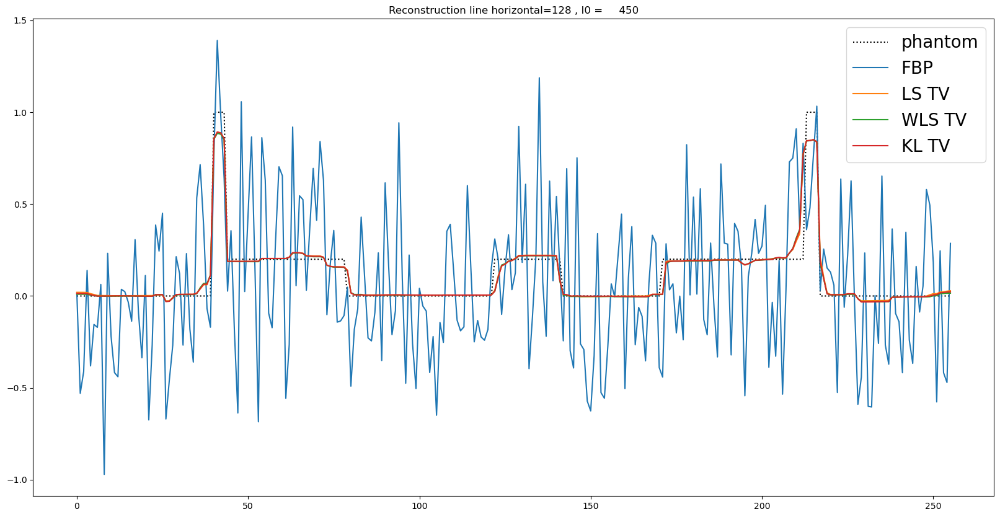

In [36]:
#And a line plot again 
plt.figure(figsize=(20,10))
plt.plot(phantom.get_slice(horizontal_y=linenumy).as_array(),':k',label="phantom")
plt.plot(recon_fbp.get_slice(horizontal_y=linenumy).as_array(),label="FBP")
plt.plot(recon_ls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="LS TV")
plt.plot(recon_wls_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="WLS TV")
plt.plot(recon_kl_tv_fista.get_slice(horizontal_y=linenumy).as_array(),label="KL TV")
plt.legend(fontsize=20)
plt.title("Reconstruction line horizontal=%3.0f , I0 = %7.f" % (linenumy,background_counts))
plt.show()


## Comparisons with TV 

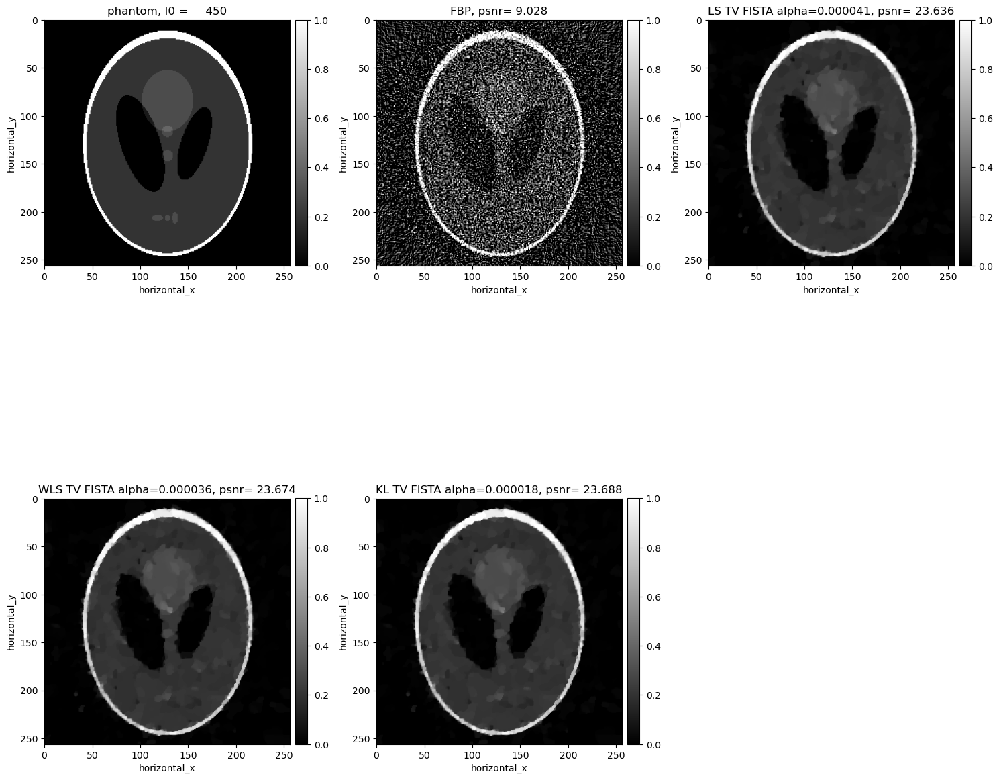

In [37]:

show2D([phantom, recon_fbp, recon_ls_tv_fista,recon_wls_tv_fista, recon_kl_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
    "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista),\
    "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista), \
    "KL TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_kl_tv_fista,psnr_kl_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=3, origin='upper-left')

# Compare all the reconstructions 

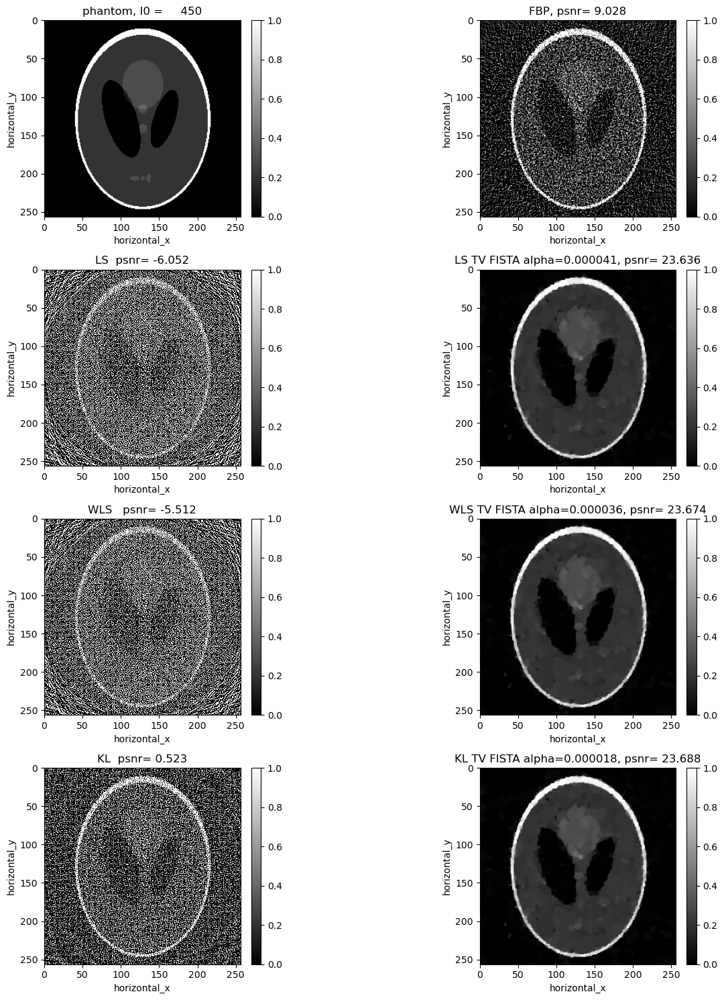

In [40]:
show2D([phantom, recon_fbp, recon_ls, recon_wls_tv_fista, recon_wls, recon_wls_tv_fista,  recon_kl, recon_kl_tv_fista ], ["phantom, I0 = %7.0f" % (background_counts), "FBP, psnr= %5.3f" % (psnr_fbp),\
   "LS  psnr= %5.3f" % (psnr_ls), "LS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_ls_tv_fista,psnr_ls_tv_fista), \
    "WLS   psnr= %5.3f" % (psnr_wls),  "WLS TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_wls_tv_fista,psnr_wls_tv_fista), \
    "KL  psnr= %5.3f" % (psnr_kl),    "KL TV FISTA alpha=%7.6f, psnr= %5.3f" % (alpha_kl_tv_fista,psnr_kl_tv_fista)], \
       cmap=cmap, fix_range =(0,1), num_cols=2, origin='upper-left')

